In [2]:
from sklearn.datasets import make_blobs
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans

#ignore the warnings
import warnings
warnings.filterwarnings('ignore')

#library for Entropy calculation
from scipy.stats import entropy

#librery for Calinski-Harabasz score calculation
from sklearn.metrics import calinski_harabasz_score

#librery for davies_bouldin score calculation
from sklearn.metrics import davies_bouldin_score

from gap_statistic import OptimalK

In [3]:
from sklearn.metrics import pairwise_distances

#function for dunn_index score calculation
def dunn_index(X, labels):
    unique_labels = np.unique(labels)
    min_intercluster_distance = np.inf
    max_intracluster_diameter = -np.inf

    for i in range(len(unique_labels)):
        for j in range(i + 1, len(unique_labels)):
            cluster_i_points = X[labels == unique_labels[i]]
            cluster_j_points = X[labels == unique_labels[j]]
            
            # Calculate the minimum distance between clusters
            intercluster_distance = np.min(pairwise_distances(cluster_i_points, cluster_j_points))
            min_intercluster_distance = min(min_intercluster_distance, intercluster_distance)

        # Calculate the maximum intra-cluster diameter
        intracluster_diameter = np.max(pairwise_distances(X[labels == unique_labels[i]]))
        max_intracluster_diameter = max(max_intracluster_diameter, intracluster_diameter)

    return min_intercluster_distance / max_intracluster_diameter

Silhouette Scores:
0.9553705288789468
0.9110194696935269
0.7775279817862045
0.574119057232986
0.45380228795496186
0.3926249684825918
0.35997311991933467
0.34808116524287425
0.33315709752410894
0.3277279375527376

Entropy Scores:
1.0
1.0
1.0
0.9999989612593212
0.9999833800893083
0.9999951236852679
0.9999951236852679
0.9996634219257006
0.9998926319715216
0.9998926319715216

Calinski Harabasz Scores:
1970392.939737402
496371.55193898955
79392.99827660096
21072.884477937416
11411.470338931671
8241.958393837702
6863.834314718007
6382.861434962477
5776.683685813635
5520.279764457068

Davies-Bouldin Scores:
15.855549363271924
7.955412765133448
3.1804162783220327
1.6319686811508658
1.198987092552848
1.0228790307141722
0.9371538106691232
0.9059944735971991
0.865108237276063
0.8487053441708876

Dunn-Index Scores:
4.072020394351142
1.7331650505966865
0.12255688666227071
0.0016355201252648418
0.002007086668370608
0.001287542236685043
0.0012882674049363063
0.0010878575245215703
0.000739835647480956

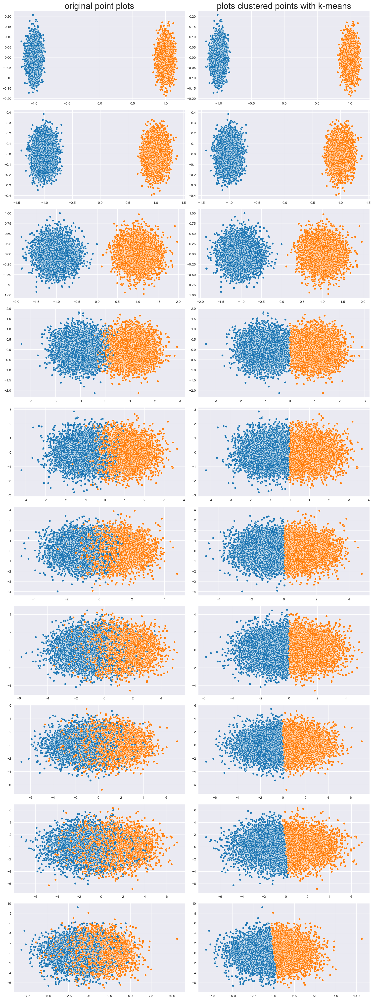

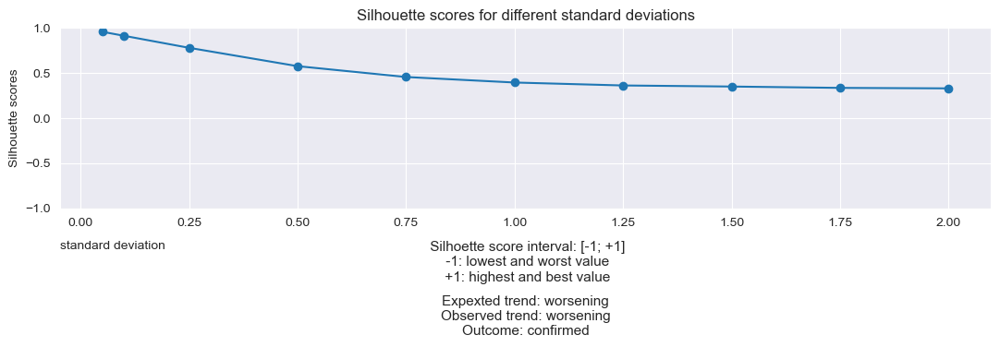

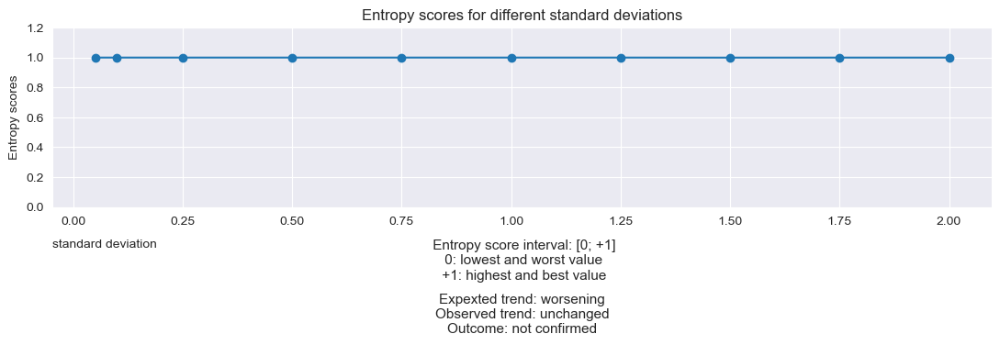

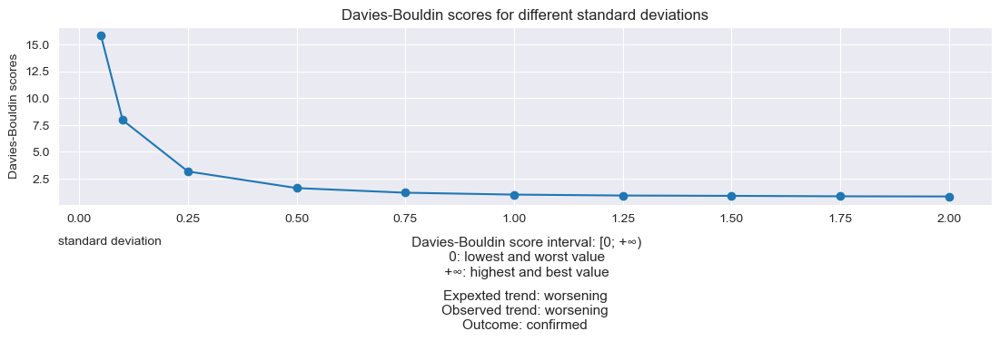

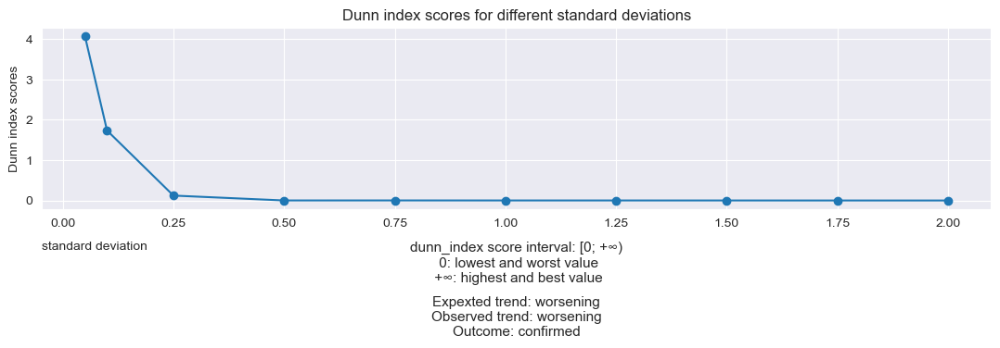

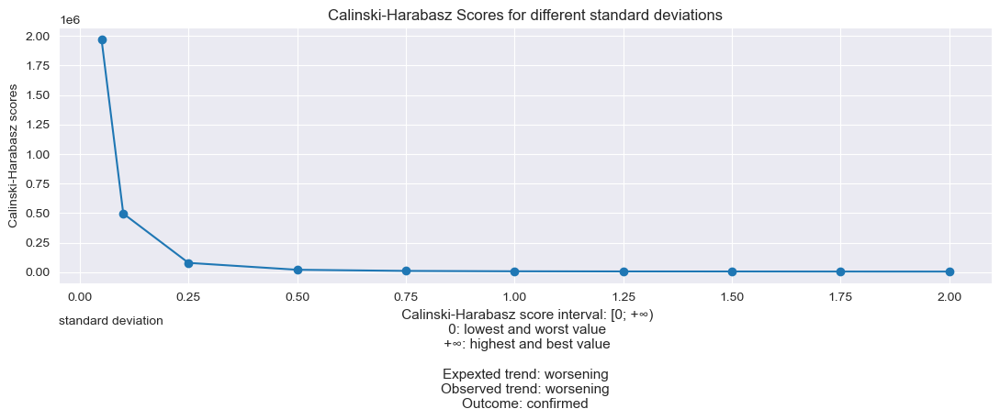

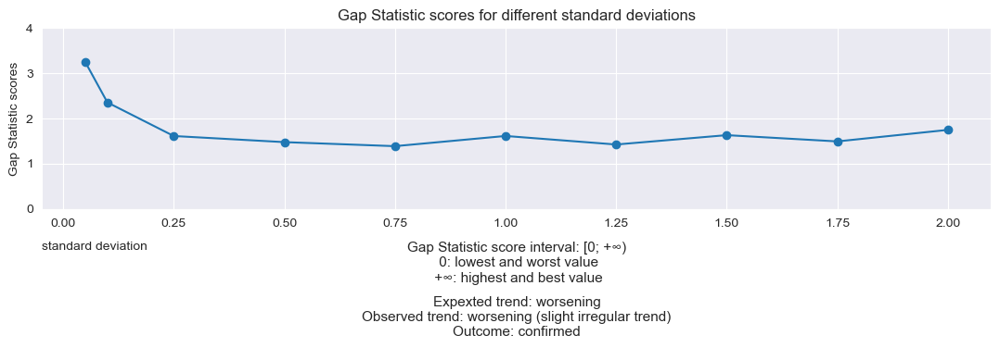

In [31]:
# Array for metric values
silhouette_scores = []  
entropy_scores = []
calinski_harabasz_scores = []
davies_bouldin_scores = []
dunn_index_scores = [] 
gap_scores = []

# Standard deviation
sds = [0.05, 0.1, 0.25, 0.5, 0.75, 1, 1.25, 1.5, 1.75, 2]

'''
# Generate random Gap Statistic values for comparison
random_gap_scores = []

# Numero di iterazioni per generare dati casuali
num_iterations = 10

for s in sds:
    gap_scores_iteration = []
    for _ in range(num_iterations):
        # Genera dati casuali
        X_random, _ = make_blobs(n_samples=1000, centers=[[0,0]], cluster_std=s)
        
        # Calcola la Gap Statistic
        optimal_k = OptimalK(parallel_backend='joblib')
        n_clusters = optimal_k(X_random, cluster_array=np.arange(1, 15))
        gap_df = optimal_k.gap_df
        optimal_gap_statistic = gap_df.loc[gap_df.gap_value.idxmax(), 'gap_value']
        gap_scores_iteration.append(optimal_gap_statistic)
    
    # Calcola la media dei valori casuali della Gap Statistic per questa deviazione standard
    mean_gap_score = np.mean(gap_scores_iteration)
    random_gap_scores.append(mean_gap_score)

# Ora hai i valori casuali della Gap Statistic per confrontarli con quelli veri
print("Valori casuali della Gap Statistic:")
print(random_gap_scores)
'''

fig, axs = plt.subplots(10,2, figsize=(15,40))
sns.set_style("darkgrid")
fig.tight_layout()

r = 0
c = 0
c2= 1

for s in sds:
    X, y = make_blobs(n_samples=10000, centers=[[-1,0],[1,0]], cluster_std=s)
    if r==0:
        scatter=sns.scatterplot(x=X[:,0], y=X[:,1], hue=y, ax=axs[r,c])
        scatter.set_title('original point plots', fontsize=25)
    sns.scatterplot(x=X[:,0], y=X[:,1], hue=y, ax=axs[r,c])
    axs[r,c].get_legend().remove()
    
    data = pd.DataFrame(np.zeros((10000, 3)))
    data.iloc[:, [0,1]] = X
    data.iloc[:, 2] = y
    data.to_csv("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_1/"+"cluster_" + str(s) + ".csv")

    km = KMeans(n_clusters=2, n_init=1, random_state=0)
    km.fit(X)
    l = km.labels_
    cs = km.cluster_centers_
    if cs[0,0] > cs[1,0]:
        l = [1 if x == 0 else 0 for x in l]
    
    # Silhouette calculation
    silhouette_avg = silhouette_score(X, l)
    silhouette_scores.append(silhouette_avg)
    
    # Entropy calculation
    entropy_val = entropy(np.bincount(l) / len(l), base=2)
    entropy_scores.append(entropy_val)
    
    # Calinski-Harabasz index calculation
    calinski_harabasz_index = calinski_harabasz_score(X, l)
    calinski_harabasz_scores.append(calinski_harabasz_index)
    
    # Davies-Bouldin calculation (reciprocal function)
    davies_bouldin_avg = davies_bouldin_score(X, l)
    davies_bouldin_avg = 1 / davies_bouldin_avg
    davies_bouldin_scores.append(davies_bouldin_avg)
    
    # Dunn index calculation
    dunn_score = dunn_index(X, l)
    dunn_index_scores.append(dunn_score)
    
    # Gap Statistic calculation
    optimal_k = OptimalK(parallel_backend='joblib')
    n_clusters = optimal_k(X, cluster_array=np.arange(1, 15))
    gap_df = optimal_k.gap_df
    optimal_gap_statistic = gap_df.loc[gap_df.gap_value.idxmax(), 'gap_value']
    gap_scores.append(optimal_gap_statistic)

    if r==0:
        scatter2=sns.scatterplot(x=X[:,0], y=X[:,1], hue=l, ax=axs[r,c2])
        scatter2.set_title('plots clustered points with k-means', fontsize=25)
    sns.scatterplot(x=X[:,0], y=X[:,1], hue=l, ax=axs[r,c2])
    axs[r,c2].get_legend().remove()        
    
    r=r+1

# Print metric arrays
print("Silhouette Scores:")
for score in silhouette_scores:
    print(score)

print("\nEntropy Scores:")
for score in entropy_scores:
    print(score)
    
print("\nCalinski Harabasz Scores:")
for score in calinski_harabasz_scores:
    print(score)

print("\nDavies-Bouldin Scores:")
for score in davies_bouldin_scores:
    print(score)
    
print("\nDunn-Index Scores:")
for score in dunn_index_scores:
    print(score)
    
print("\nGap Scores:")
for score in gap_scores:
    print(score)

#print(optimal_k.gap_df .iloc[:,:3])

# Save metric values to a txt file
with open("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_1/metrics_values.txt", "w") as file:
    file.write("Silhouette Scores:\n")
    for score in silhouette_scores:
        file.write(str(score) + "\n")

    file.write("\nEntropy Scores:\n")
    for score in entropy_scores:
        file.write(str(score) + "\n")

    file.write("\nCalinski Harabasz Scores:\n")
    for score in calinski_harabasz_scores:
        file.write(str(score) + "\n")

    file.write("\nDavies-Bouldin Scores:\n")
    for score in davies_bouldin_scores:
        file.write(str(score) + "\n")

    file.write("\nDunn-Index Scores:\n")
    for score in dunn_index_scores:
        file.write(str(score) + "\n")

    file.write("\nGap Scores:\n")
    for score in gap_scores:
        file.write(str(score) + "\n")

# Plot of Silhouette variations
plt.figure(figsize=(11, 5))
plt.plot(sds, silhouette_scores, marker='o')
plt.title('Silhouette scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Silhouette scores')
plt.grid(True)
plt.ylim(-1, 1)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_1/variazioni_Silhouette_1.png'
text = ' Silhoette score interval: [-1; +1]\n -1: lowest and worst value\n +1: highest and best value'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
text2='Expexted trend: worsening\nObserved trend: worsening\nOutcome: confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Entropy variations
plt.figure(figsize=(11, 5))
plt.plot(sds, entropy_scores, marker='o')
plt.title('Entropy scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Entropy scores')
plt.grid(True)
plt.ylim(0, 1.2)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_1/variazioni_Entropy_1.png'
text=' Entropy score interval: [0; +1]\n 0: lowest and worst value\n +1: highest and best value'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
text2='Expexted trend: worsening\nObserved trend: unchanged\nOutcome: not confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Davies_Bouldin variations
plt.figure(figsize=(11, 5))
plt.plot(sds, davies_bouldin_scores, marker='o')
plt.title('Davies-Bouldin scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Davies-Bouldin scores')
plt.grid(True)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_1/variazioni_Davies_Bouldin_1.png'
text=' Davies-Bouldin score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
text2='Expexted trend: worsening\nObserved trend: worsening\nOutcome: confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Dunn_index variations
plt.figure(figsize=(11, 5))
plt.plot(sds, dunn_index_scores, marker='o')
plt.title('Dunn index scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Dunn index scores')
plt.grid(True)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_1/variazioni_dunn_index_1.png'
text = 'dunn_index score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value' 
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes, fontsize=11)
text2='Expexted trend: worsening\nObserved trend: worsening\nOutcome: confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Calinski_Harabasz Scores variations
plt.figure(figsize=(11, 5))
plt.plot(sds, calinski_harabasz_scores, marker='o')
plt.title('Calinski-Harabasz Scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Calinski-Harabasz scores')
plt.grid(True)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_1/variazioni_Calinski_Harabasz_1.png'
text=' Calinski-Harabasz score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value\n\nExpexted trend: worsening\nObserved trend: worsening\nOutcome: confirmed'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Gap Statistic variations
plt.figure(figsize=(11, 5))
plt.plot(sds, gap_scores, marker='o')
plt.title('Gap Statistic scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Gap Statistic scores')
plt.grid(True)
plt.ylim(0, 4)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_1/variazioni_gap_1.png'
text = 'Gap Statistic score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value' 
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes, fontsize=11)
text2='Expexted trend: worsening\nObserved trend: worsening (slight irregular trend)\nOutcome: confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

with open("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_1/report_1.txt", "w") as file:
    file.write("Report:\n")
    file.write("I expected the metrics to get worse as the standard deviation increases. This happened with all metrics except Entropy which remains practically constant for all standard deviations\n")

fig.savefig("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_1/gaussians.png", facecolor="gray")

Silhouette Scores:
0.3451199635618048
0.35580351721136105
0.44126862660431493
0.5095198912089374
0.5381469444067843
0.5407000744780261

Entropy Scores:
0.9941598092516277
0.9772525577331418
0.9118063409237643
0.9424114403143551
0.9571519685431349
0.9860247628789438

Calinski Harabasz Scores:
213.64487643647544
218.72277608959106
265.85344884335154
365.49034968883984
446.4309372702577
506.233495175216

Davies-Bouldin Scores:
0.8283090249534153
0.8461105542052633
0.9802237396653194
1.10974530069456
1.2280538691214733
1.2809152684582727

Dunn-Index Scores:
0.025782088504119838
0.021818758061990524
0.019814280204338782
0.022973836304669155
0.02764683689602595
0.02042393649681793

Gap Scores:
0.693213749935039
0.522373994259864
0.5336939232978666
0.8871449553215405
0.917734644276692
0.893829267899644


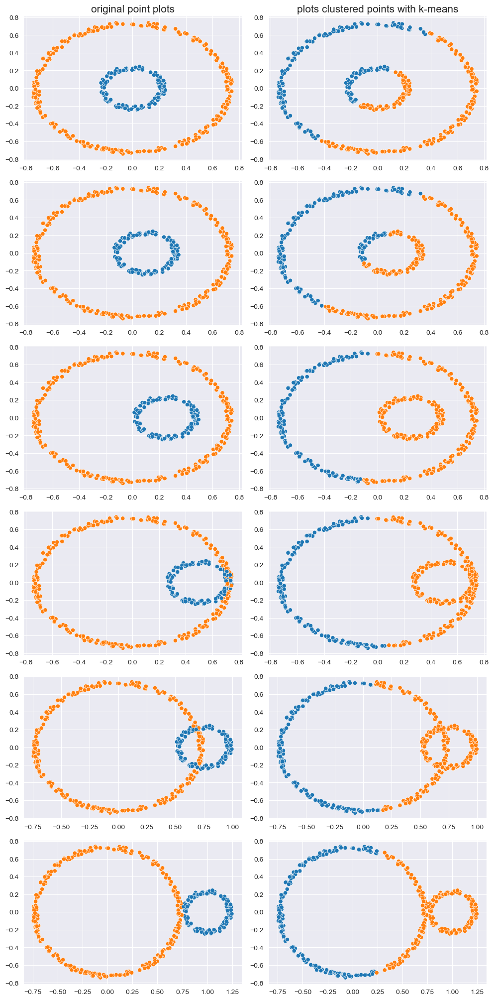

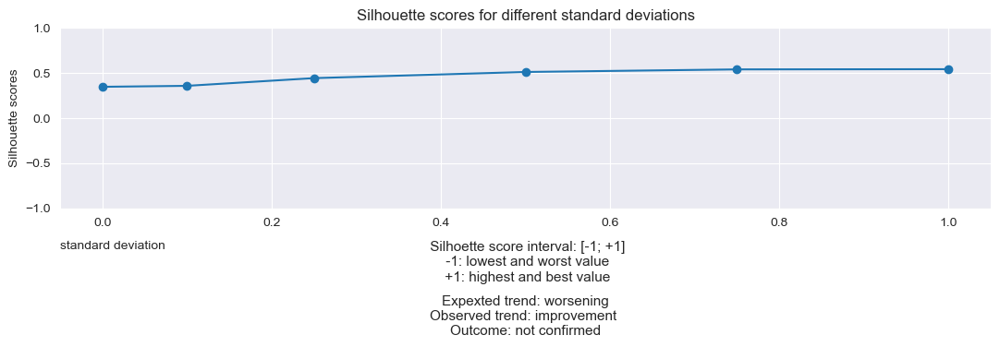

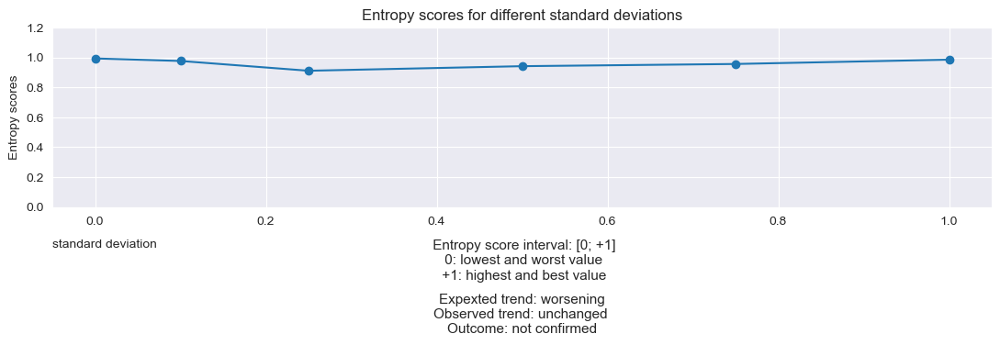

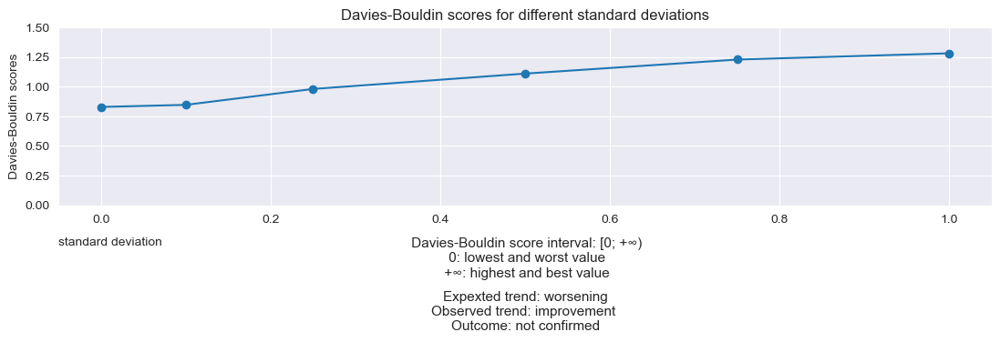

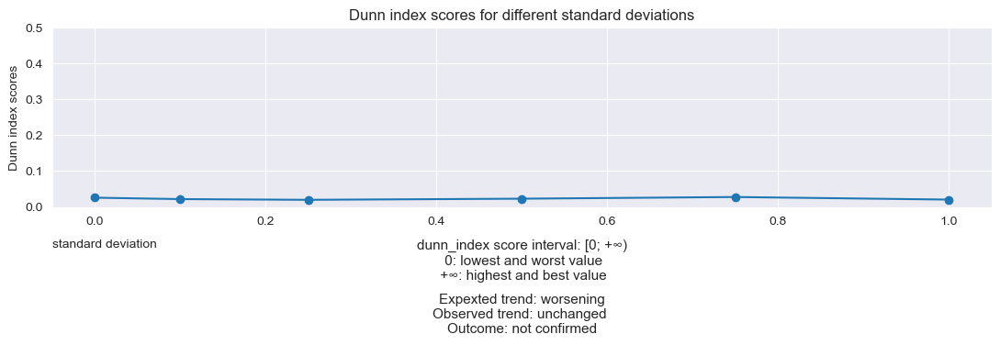

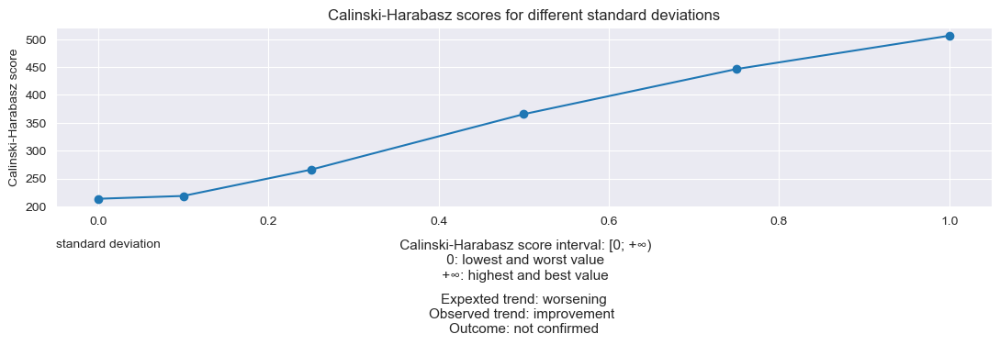

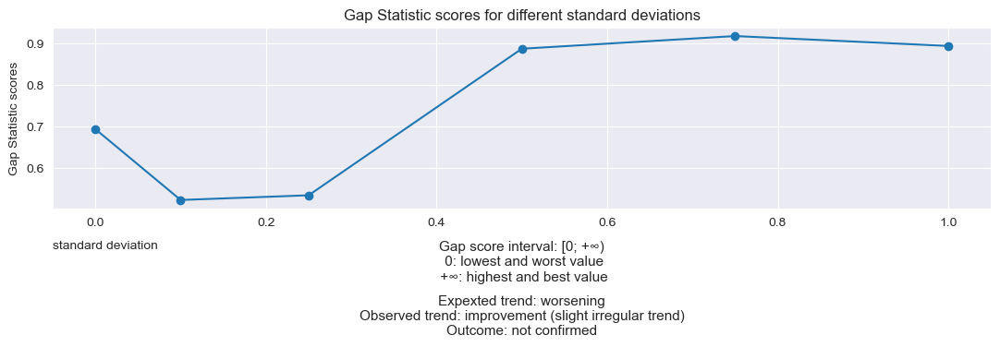

In [34]:
# Array for metric values
silhouette_scores = []  
entropy_scores = []
calinski_harabasz_scores = []
davies_bouldin_scores = []
dunn_index_scores = [] 
gap_scores = []


# standard deviation
sds = np.array([0, 0.1, 0.25, 0.5, 0.75, 1])
#[::-1]
#print(sds)

fig, axs = plt.subplots(6,2, figsize=(10,20))
sns.set_style("darkgrid")
fig.tight_layout()

r = 0
c = 0
c2= 1

for s in sds:
    #print(s)
    centers = np.array([[s,0],[0,0]])
    
    X, y = make_blobs(n_samples=[1000,9000], centers=centers, cluster_std=[0.25,1], random_state=0)
    
    cond1 = ((0.20**2 <= (X[:,0]-centers[0,0])**2 + (X[:,1] - centers[0,1])**2) & ((X[:,0]-centers[0,0])**2 + (X[:,1] - centers[0,1])**2 <= 0.25**2))
    cond2 = ((0.7**2 <=(X[:,0]-centers[1,0])**2 + (X[:,1] - centers[1,1])**2) & ((X[:,0]-centers[1,0])**2 + (X[:,1] - centers[1,1])**2 <= 0.75**2))
    X_temp = X[((y==0) & cond1) | ((y==1) & cond2)]
    y = y[((y==0) & cond1) | ((y==1) & cond2)]
    X = X_temp
    
    if r==0:
        scatter=sns.scatterplot(x=X[:,0], y=X[:,1], hue=y, ax=axs[r,c])
        scatter.set_title('original point plots', fontsize=15)
    sns.scatterplot(x=X[:,0], y=X[:,1], hue=y, ax=axs[r,c])

    #axs[r,c].set_xticks([])
    #axs[r,c].set_yticks([])
    axs[r,c].get_legend().remove()
    
    data = pd.DataFrame(np.zeros((X.shape[0], 3)))
    data.iloc[:, [0,1]] = X
    data.iloc[:, 2] = y
    data.to_csv("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_2/cluster_" + str(s) + ".csv")

    km = KMeans(n_clusters=2, n_init=1, random_state=0)
    km.fit(X)
    l = km.labels_
    cs = km.cluster_centers_
    if cs[0,0] > cs[1,0]:
        l = [1 if x == 0 else 0 for x in l]
    
    # Silhouette calculation
    silhouette_avg = silhouette_score(X, l)
    silhouette_scores.append(silhouette_avg)
    #print(f"Silhouette Score for cluster_{s}: {silhouette_avg}")
    
    # Entropy calculation
    entropy_val = entropy(np.bincount(l) / len(l), base=2)
    entropy_scores.append(entropy_val)
    #print(f"Entropia Score for cluster_{s}: {entropy_val}")

    
    # Calinski-Harabasz index calculation
    calinski_harabasz_index = calinski_harabasz_score(X, l)
    calinski_harabasz_scores.append(calinski_harabasz_index)
    #print(f"Calinski-Harabasz Score for cluster_{s}: {calinski_harabasz_index}")

    
    # Davies-Bouldin calculation (reciprocal function)
    davies_bouldin_avg = davies_bouldin_score(X, l)
    davies_bouldin_avg = 1 / davies_bouldin_avg
    davies_bouldin_scores.append(davies_bouldin_avg)
    
    # Dunn index calculation
    dunn_score = dunn_index(X, l)
    dunn_index_scores.append(dunn_score)
    
    # Gap Statistic Calculation
    optimal_k = OptimalK(parallel_backend='joblib')
    n_clusters = optimal_k(X, cluster_array=np.arange(1, 15))
    gap_df = optimal_k.gap_df
    optimal_gap_statistic = gap_df.loc[gap_df.gap_value.idxmax(), 'gap_value']
    gap_scores.append(optimal_gap_statistic)
    
    if r==0:
        scatter2=sns.scatterplot(x=X[:,0], y=X[:,1], hue=y, ax=axs[r,c2])
        scatter2.set_title('plots clustered points with k-means', fontsize=15)
    sns.scatterplot(x=X[:,0], y=X[:,1], hue=l, ax=axs[r,c2])

    #axs[c,r].set_xticks([])
    #axs[c,r].set_yticks([])
    axs[r,c2].get_legend().remove()
    
    r=r+1 
        
#print metric arrays
print("Silhouette Scores:")
for score in silhouette_scores:
    print(score)

print("\nEntropy Scores:")
for score in entropy_scores:
    print(score)
    
print("\nCalinski Harabasz Scores:")
for score in calinski_harabasz_scores:
    print(score)

print("\nDavies-Bouldin Scores:")
for score in davies_bouldin_scores:
    print(score)
    
print("\nDunn-Index Scores:")
for score in dunn_index_scores:
    print(score)

print("\nGap Scores:")
for score in gap_scores:
    print(score)    
    
#print(optimal_k.gap_df .iloc[:,:3])

#save the values of the metrics in a txt file
with open("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_2/metrics_values_2.txt", "w") as file:
    file.write("Silhouette Scores:\n")
    for score in silhouette_scores:
        file.write(str(score) + "\n")

    file.write("\nEntropy Scores:\n")
    for score in entropy_scores:
        file.write(str(score) + "\n")

    file.write("\nCalinski Harabasz Scores:\n")
    for score in calinski_harabasz_scores:
        file.write(str(score) + "\n")

    file.write("\nDavies-Bouldin Scores:\n")
    for score in davies_bouldin_scores:
        file.write(str(score) + "\n")

    file.write("\nDunn-Index Scores:\n")
    for score in dunn_index_scores:
        file.write(str(score) + "\n")
    
    file.write("\nGap Scores:\n")
    for score in gap_scores:
        file.write(str(score) + "\n")

# Plot of Silhouette variations
plt.figure(figsize=(11, 5))
plt.plot(sds, silhouette_scores, marker='o')
plt.title('Silhouette scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Silhouette scores')
plt.grid(True)
plt.ylim(-1, 1)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_2/variazioni_Silhouette_2.png'
text = ' Silhoette score interval: [-1; +1]\n -1: lowest and worst value\n +1: highest and best value'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
text2='Expexted trend: worsening\nObserved trend: improvement \nOutcome: not confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()


# Plot of Entropy variations
plt.figure(figsize=(11, 5))
plt.plot(sds, entropy_scores, marker='o')
plt.title('Entropy scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Entropy scores')
plt.grid(True)
plt.ylim(0, 1.2)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_2/variazioni_Entropy_2.png'
text=' Entropy score interval: [0; +1]\n 0: lowest and worst value\n +1: highest and best value'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
text2='Expexted trend: worsening\nObserved trend: unchanged \nOutcome: not confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Davies_Bouldin variations
plt.figure(figsize=(11, 5))
plt.plot(sds, davies_bouldin_scores, marker='o')
plt.title('Davies-Bouldin scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Davies-Bouldin scores')
plt.grid(True)
plt.ylim(0, 1.5)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_2/variazioni_Davies_Bouldin_2.png'
text=' Davies-Bouldin score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
text2='Expexted trend: worsening\nObserved trend: improvement \nOutcome: not confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Dunn index variations
plt.figure(figsize=(11, 5))
plt.plot(sds, dunn_index_scores, marker='o')
plt.title('Dunn index scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Dunn index scores')
plt.grid(True)
plt.ylim(0, 0.5)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_2/variazioni_dunn_index_2.png'
text = 'dunn_index score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value' 
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes, fontsize=11)
text2='Expexted trend: worsening\nObserved trend: unchanged \nOutcome: not confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes, fontsize=11)
plt.tight_layout()  
plt.savefig(file_path)
plt.show()

# Plot of Calinski_Harabasz variations
plt.figure(figsize=(11, 5))
plt.plot(sds, calinski_harabasz_scores, marker='o')
plt.title('Calinski-Harabasz scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Calinski-Harabasz score')
plt.grid(True)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_2/variazioni_Calinski_Harabasz_2.png'
text=' Calinski-Harabasz score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
text2='Expexted trend: worsening\nObserved trend: improvement \nOutcome: not confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes, fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Gap Statistic variations
plt.figure(figsize=(11, 5))
plt.plot(sds, gap_scores, marker='o')
plt.title('Gap Statistic scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Gap Statistic scores')
plt.grid(True)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_2/variazioni_gap_2.png'
text = 'Gap score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value' 
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes, fontsize=11)
text2='Expexted trend: worsening\nObserved trend: improvement (slight irregular trend)\nOutcome: not confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes, fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

with open("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_2/report2.txt", "w") as file:
    file.write("Report:\n")
    file.write("I expected the metrics to get worse as the standard deviation increases. On the contrary, all the metrics, except Dunn index and Entropy which\nremain almost constant, improve as the standard deviation increases")

fig.savefig("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_2/circles.png", facecolor="gray")

Silhouette Scores:
0.3802200386628753
0.366026584392672
0.3683301382950182
0.5709213500504051
0.6130272651224513
0.6806113681607803

Entropy Scores:
0.99984594171614
0.9960555828802036
0.996808034197994
0.9969876523671413
0.996272235744086
0.9993532796714473

Calinski Harabasz Scores:
702.0363360027342
635.2726757844474
493.67623819241504
623.2352948182182
666.2857881945918
498.14585085531627

Davies-Bouldin Scores:
0.9470727300401038
0.9165020057920297
0.8761925417837525
1.4359563080565043
1.5999286474522358
1.9928349202581916

Dunn-Index Scores:
0.01075552430389881
0.011984799299826078
0.005209425077486726
0.282972149125958
0.41303550157986646
0.6699911656041051

Gap Scores:
0.21744121284352413
0.19209946769515795
0.2948442261258597
0.6346547114024297
0.795873192715979
1.0508929971731569


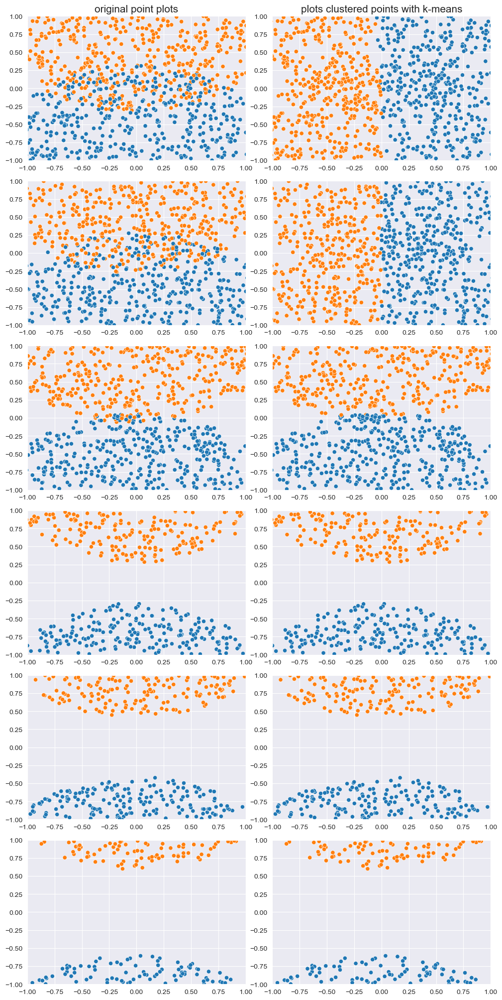

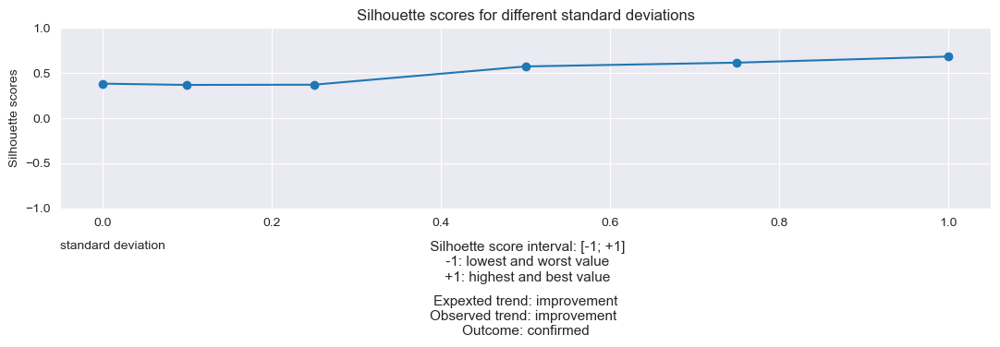

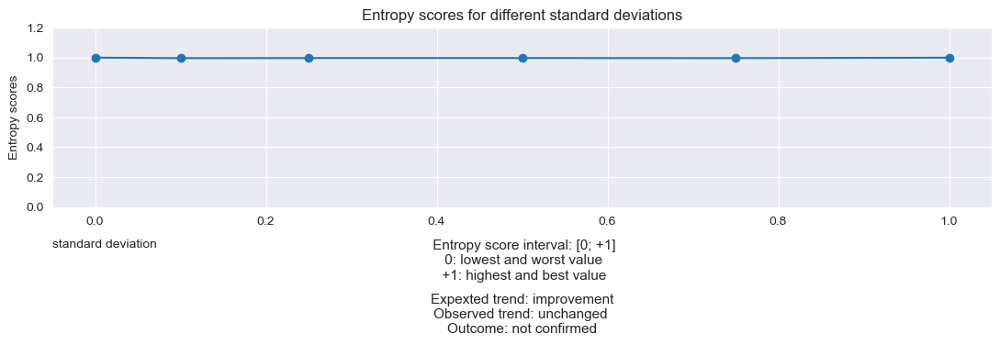

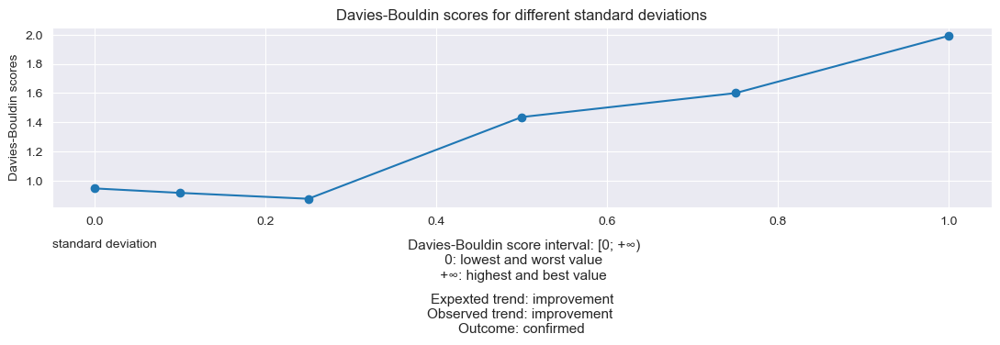

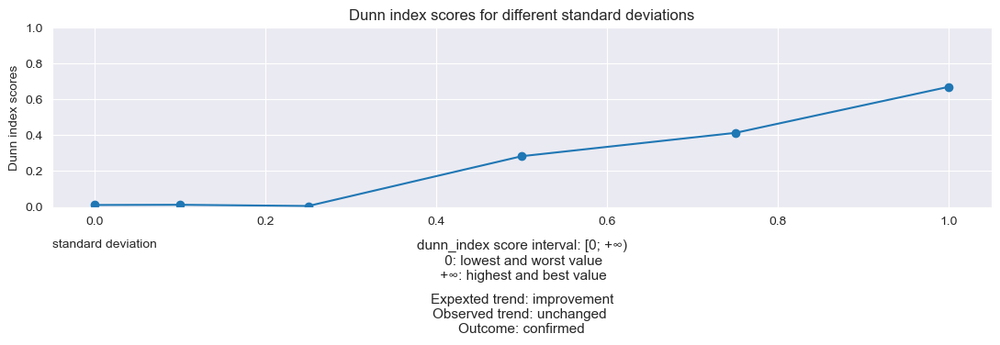

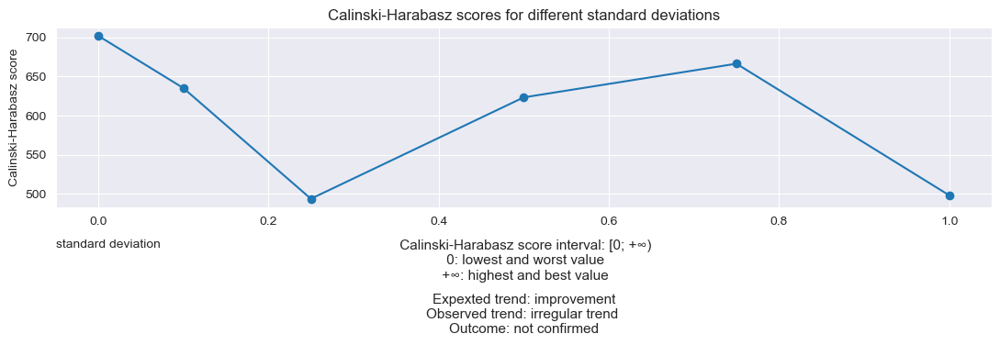

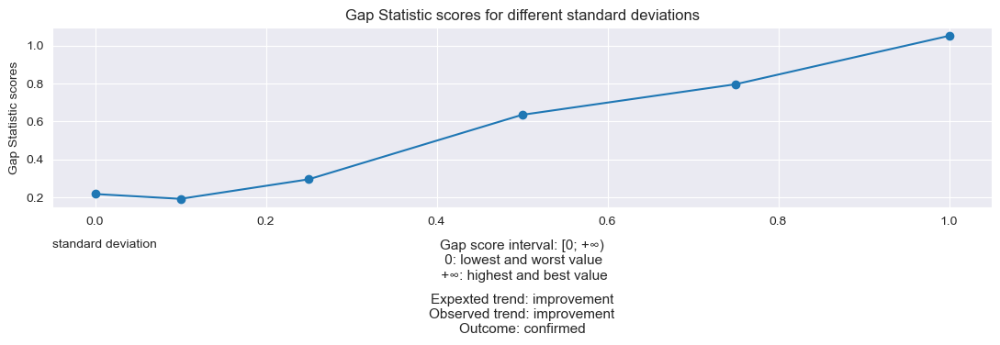

In [35]:
# Array for metric values
silhouette_scores = []  
entropy_scores = []
calinski_harabasz_scores = []
davies_bouldin_scores = []
dunn_index_scores = [] 
gap_scores = []

#standard deviation
cds = [2, 1.75, 1.5, 1.25, 1.1, 1][::-1]
rs = [1.75, 1.9, 1.75, 1.5, 1.8, 2]

fig, axs = plt.subplots(6,2, figsize=(10,20))
sns.set_style("darkgrid")
fig.tight_layout()


r = 0
c = 0
c2= 1

for i,s in enumerate(cds):
    centers = np.array([[0,-s],[0,s]])
    X, y = make_blobs(n_samples=10000, centers=centers, cluster_std=2)

    cond1 = (((X[:,0]-0)**2 + (X[:,1] - (-s))**2) <= rs[i])
    cond2 = (((X[:,0]-0)**2 + (X[:,1] - s)**2) <= rs[i])
    X_temp = X[(((cond1) & (y == 0)) | ((cond2) & (y == 1))) & (np.abs(X[:,1]) <= 1)]
    y = y[(((cond1) & (y == 0)) | ((cond2) & (y == 1))) & (np.abs(X[:,1]) <= 1)]
    X = X_temp

    if r==0:
        scatter=sns.scatterplot(x=X[:,0], y=X[:,1], hue=y, ax=axs[r,c])
        scatter.set_title('original point plots', fontsize=15)
    sns.scatterplot(x=X[:,0], y=X[:,1], hue=y, ax=axs[r,c])


    axs[r,c].set_xlim(-1,1)
    axs[r,c].set_ylim(-1,1)
    #axs[r,c].set_xticks([])
    #axs[r,c].set_yticks([])
    axs[r,c].get_legend().remove()
    
    data = pd.DataFrame(np.zeros((X.shape[0], 3)))
    data.iloc[:, [0,1]] = X
    data.iloc[:, 2] = y
    data.iloc[:1000,:].to_csv("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_3/circles_cluster_" + str(s) + ".csv")

    km = KMeans(n_clusters=2, n_init=1, random_state=0)
    km.fit(X)
    l = km.labels_
    cs = km.cluster_centers_
    if cs[0,1] > cs[0,0]:
        l = [1 if x == 0 else 0 for x in l]
    
    # Silhouette calculation
    silhouette_avg = silhouette_score(X, l)
    silhouette_scores.append(silhouette_avg)
    
    # Entropy calculation
    entropy_val = entropy(np.bincount(l) / len(l), base=2)
    entropy_scores.append(entropy_val)
    
    # Calinski-Harabasz index calculation
    calinski_harabasz_index = calinski_harabasz_score(X, l)
    calinski_harabasz_scores.append(calinski_harabasz_index)
    
    # Davies-Bouldin calculation (reciprocal function)
    davies_bouldin_avg = davies_bouldin_score(X, l)
    davies_bouldin_avg = 1 / davies_bouldin_avg
    davies_bouldin_scores.append(davies_bouldin_avg)
    
    # Dunn index calculation
    dunn_score = dunn_index(X, l)
    dunn_index_scores.append(dunn_score)
    
    # Gap Statistic calculation
    optimal_k = OptimalK(parallel_backend='joblib')
    n_clusters = optimal_k(X, cluster_array=np.arange(1, 15))
    gap_df = optimal_k.gap_df
    optimal_gap_statistic = gap_df.loc[gap_df.gap_value.idxmax(), 'gap_value']
    gap_scores.append(optimal_gap_statistic)
    
    if r==0:
        scatter2=sns.scatterplot(x=X[:,0], y=X[:,1], hue=y, ax=axs[r,c2])
        scatter2.set_title('plots clustered points with k-means', fontsize=15)
    sns.scatterplot(x=X[:,0], y=X[:,1], hue=l, ax=axs[r,c2])

    #axs[c,r].set_xticks([])
    #axs[c,r].set_yticks([])
    axs[r,c2].set_xlim(-1,1)
    axs[r,c2].set_ylim(-1,1)
    axs[r,c2].get_legend().remove()
    
    r += 1
    
# Print metric arrays
print("Silhouette Scores:")
for score in silhouette_scores:
    print(score)

print("\nEntropy Scores:")
for score in entropy_scores:
    print(score)
    
print("\nCalinski Harabasz Scores:")
for score in calinski_harabasz_scores:
    print(score)

print("\nDavies-Bouldin Scores:")
for score in davies_bouldin_scores:
    print(score)
    
print("\nDunn-Index Scores:")
for score in dunn_index_scores:
    print(score)

print("\nGap Scores:")
for score in gap_scores:
    print(score)    
    
#print(optimal_k.gap_df .iloc[:,:3])
    
#save the values of the metrics in a txt file
with open("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_3/metrics_values_3.txt", "w") as file:
    file.write("Silhouette Scores:\n")
    for score in silhouette_scores:
        file.write(str(score) + "\n")

    file.write("\nEntropy Scores:\n")
    for score in entropy_scores:
        file.write(str(score) + "\n")

    file.write("\nCalinski Harabasz Scores:\n")
    for score in calinski_harabasz_scores:
        file.write(str(score) + "\n")

    file.write("\nDavies-Bouldin Scores:\n")
    for score in davies_bouldin_scores:
        file.write(str(score) + "\n")

    file.write("\nDunn-Index Scores:\n")
    for score in dunn_index_scores:
        file.write(str(score) + "\n")
    
    file.write("\nGap Scores:\n")
    for score in gap_scores:
        file.write(str(score) + "\n")

# Plot of Silhouette variations
plt.figure(figsize=(11, 5))
plt.plot(sds, silhouette_scores, marker='o')
plt.title('Silhouette scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Silhouette scores')
plt.grid(True)
plt.ylim(-1, 1)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_2/variazioni_Silhouette_2.png'
text = ' Silhoette score interval: [-1; +1]\n -1: lowest and worst value\n +1: highest and best value'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
text2='Expexted trend: improvement\nObserved trend: improvement \nOutcome: confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()


# Plot of Entropy variations
plt.figure(figsize=(11, 5))
plt.plot(sds, entropy_scores, marker='o')
plt.title('Entropy scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Entropy scores')
plt.grid(True)
plt.ylim(0, 1.2)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_3/variazioni_Entropy_3.png'
text=' Entropy score interval: [0; +1]\n 0: lowest and worst value\n +1: highest and best value'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
text2='Expexted trend: improvement\nObserved trend: unchanged \nOutcome: not confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Davies_Bouldin variations
plt.figure(figsize=(11, 5))
plt.plot(sds, davies_bouldin_scores, marker='o')
plt.title('Davies-Bouldin scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Davies-Bouldin scores')
plt.grid(True)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_3/variazioni_Davies_Bouldin_3.png'
text=' Davies-Bouldin score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
text2='Expexted trend: improvement\nObserved trend: improvement \nOutcome: confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Dunn index variations
plt.figure(figsize=(11, 5))
plt.plot(sds, dunn_index_scores, marker='o')
plt.title('Dunn index scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Dunn index scores')
plt.grid(True)
plt.ylim(0, 1)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_3/variazioni_dunn_index_3.png'
text = 'dunn_index score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value' 
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes, fontsize=11)
text2='Expexted trend: improvement\nObserved trend: unchanged \nOutcome: confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes, fontsize=11)
plt.tight_layout()  
plt.savefig(file_path)
plt.show()

# Plot of Calinski_Harabasz variations
plt.figure(figsize=(11, 5))
plt.plot(sds, calinski_harabasz_scores, marker='o')
plt.title('Calinski-Harabasz scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Calinski-Harabasz score')
plt.grid(True)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_3/variazioni_Calinski_Harabasz_3.png'
text=' Calinski-Harabasz score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
text2='Expexted trend: improvement\nObserved trend: irregular trend \nOutcome: not confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes, fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Gap Statistic variations
plt.figure(figsize=(11, 5))
plt.plot(sds, gap_scores, marker='o')
plt.title('Gap Statistic scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Gap Statistic scores')
plt.grid(True)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_3/variazioni_gap_3.png'
text = 'Gap score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value' 
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes, fontsize=11)
text2='Expexted trend: improvement\nObserved trend: improvement\nOutcome: confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes, fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

with open("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_3/report_3.txt", "w") as file:
    file.write("Report:\n")
    file.write("I expected the metrics to get better as the standard deviation increases. This happened with all metrics except Entropy which remains practically\nconstant for all standard deviations and with Calinski-Harabasz that has an irregular trend")

fig.savefig("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_3/semi_circles.png", facecolor="gray")

Silhouette Scores:
0.4908887221849286
0.4865565327104796
0.4700288357581456
0.454435445004836
0.43617146861948397
0.41439431475285227

Entropy Scores:
0.9999819662368478
0.9999895837167361
0.9999992786523595
0.9997662707810439
0.9998289184593941
0.9998462320994094

Calinski Harabasz Scores:
14843.449150274071
14570.073305963422
13505.722354896134
12214.822959316713
10962.53686027578
9652.46547532865

Davies-Bouldin Scores:
1.2805659042745996
1.2766176742957915
1.2496520769424935
1.2052257410149354
1.1526715182364433
1.09157303074351

Dunn-Index Scores:
0.0014629411699403452
0.0019603377885548203
0.0025137979807976513
0.0013381102823296933
0.0013839492585325857
0.001885543745615661

Gap Scores:
1.2131603455570694
1.1466860756209245
0.9211636542518811
1.045135796847335
1.383526000693866
1.2777952617700379


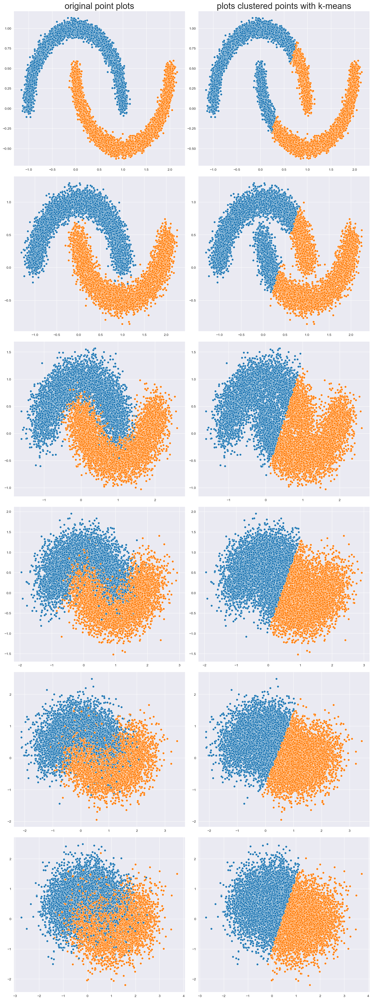

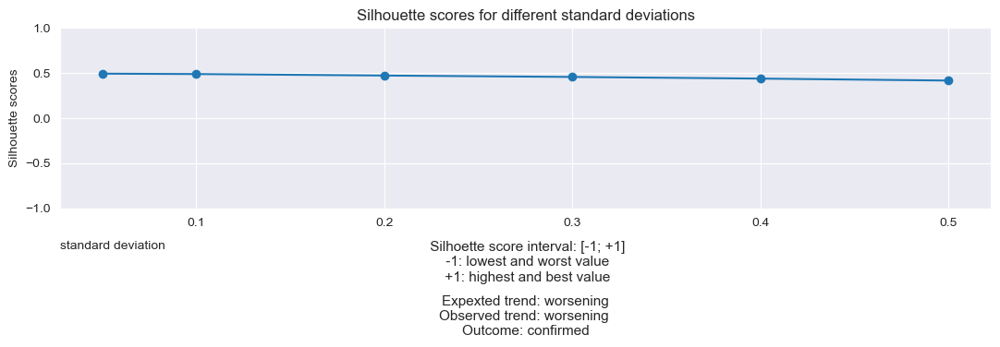

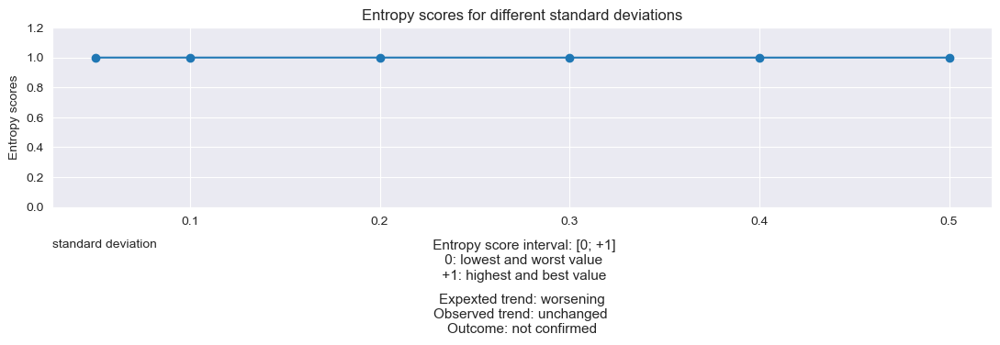

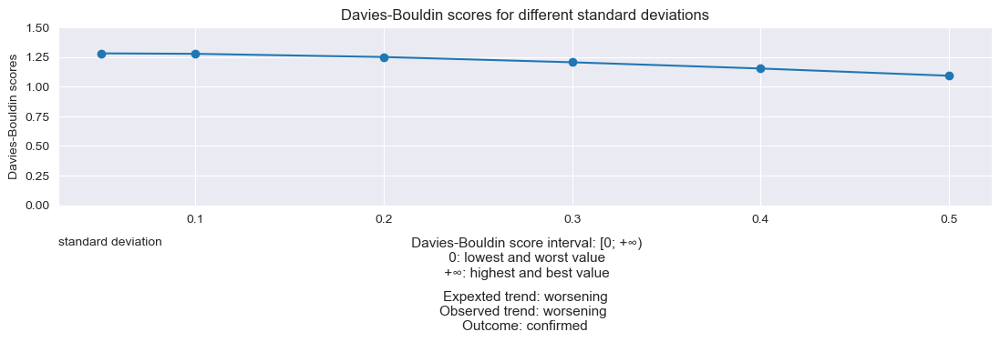

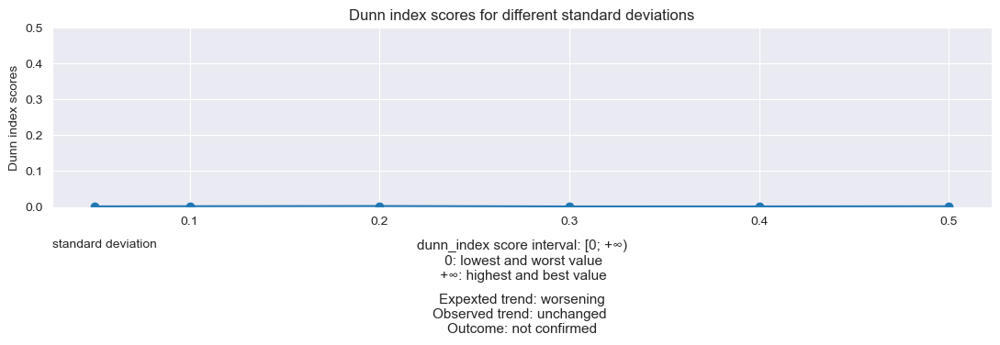

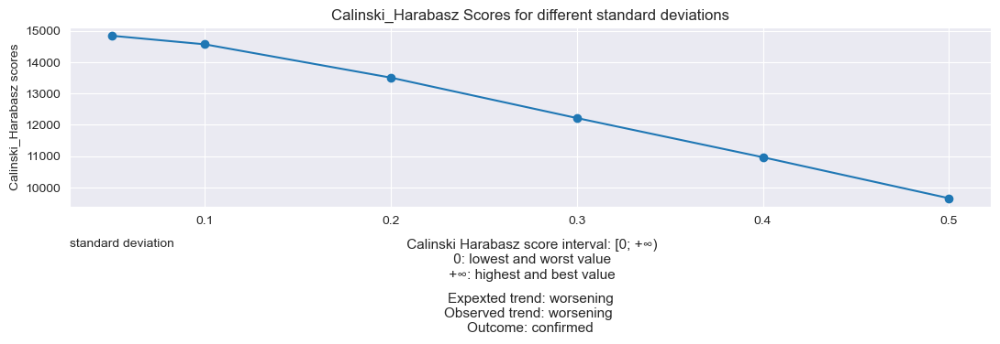

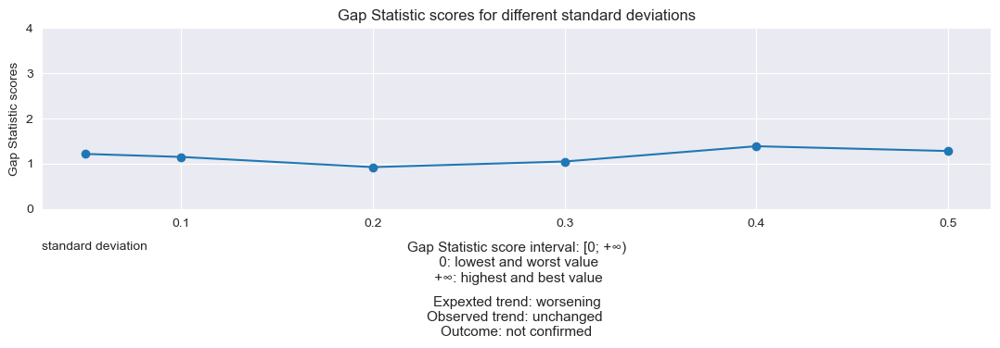

In [37]:
import time
import warnings
from itertools import cycle, islice

from sklearn import cluster, datasets, mixture
from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler

# Array for metric values
silhouette_scores = []  
entropy_scores = []
calinski_harabasz_scores = []
davies_bouldin_scores = []
dunn_index_scores = [] 
gap_scores = []

n_samples = 10000

# Standard deviation
sds = [0.05, 0.1, 0.2, 0.3, 0.4, 0.5]

fig, axs = plt.subplots(6,2, figsize=(15,40))
sns.set_style("darkgrid")
fig.tight_layout()

r = 0
c = 0
c2= 1

# Iterate over each standard deviation
for i, sd in enumerate(sds):
    # Generate the dataset with the current standard deviation
    noisy_moons = datasets.make_moons(n_samples=n_samples, noise=sd)

    # Extract x and y coordinates of the points
    X, y = noisy_moons

    if r==0:
        scatter=sns.scatterplot(x=X[:,0], y=X[:,1], hue=y, ax=axs[r,c])
        scatter.set_title('original point plots', fontsize=25)
    sns.scatterplot(x=X[:,0], y=X[:,1], hue=y, ax=axs[r,c])
    axs[r,c].get_legend().remove()
    
    data = pd.DataFrame(np.zeros((X.shape[0], 3)))
    data.iloc[:, [0,1]] = X
    data.iloc[:, 2] = y
    data.iloc[:1000,:].to_csv("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_4/crescents_cluster_" + str(sd) + ".csv")
    
    km = KMeans(n_clusters=2, n_init=1, random_state=0)
    km.fit(X)
    l = km.labels_
    cs = km.cluster_centers_
    if cs[0,0] > cs[1,0]:
        l = [1 if x == 0 else 0 for x in l]
    
    # Silhouette calculation
    silhouette_avg = silhouette_score(X, l)
    silhouette_scores.append(silhouette_avg)
    
    # Entropy calculation
    entropy_val = entropy(np.bincount(l) / len(l), base=2)
    entropy_scores.append(entropy_val)
    
    # Calinski-Harabasz index calculation
    calinski_harabasz_index = calinski_harabasz_score(X, l)
    calinski_harabasz_scores.append(calinski_harabasz_index)
    
    # Davies-Bouldin calculation (reciprocal function)
    davies_bouldin_avg = davies_bouldin_score(X, l)
    davies_bouldin_avg = 1 / davies_bouldin_avg
    davies_bouldin_scores.append(davies_bouldin_avg)
    
    # Dunn index calculation
    dunn_score = dunn_index(X, l)
    dunn_index_scores.append(dunn_score)
    
    # Gap Statistic calculation
    optimal_k = OptimalK(parallel_backend='joblib')
    n_clusters = optimal_k(X, cluster_array=np.arange(1, 15))
    gap_df = optimal_k.gap_df
    optimal_gap_statistic = gap_df.loc[gap_df.gap_value.idxmax(), 'gap_value']
    gap_scores.append(optimal_gap_statistic)

    if r==0:
        scatter2=sns.scatterplot(x=X[:,0], y=X[:,1], hue=l, ax=axs[r,c2])
        scatter2.set_title('plots clustered points with k-means', fontsize=25)
    sns.scatterplot(x=X[:,0], y=X[:,1], hue=l, ax=axs[r,c2])
    axs[r,c2].get_legend().remove()        
    
    r=r+1

# Print metric arrays
print("Silhouette Scores:")
for score in silhouette_scores:
    print(score)

print("\nEntropy Scores:")
for score in entropy_scores:
    print(score)
    
print("\nCalinski Harabasz Scores:")
for score in calinski_harabasz_scores:
    print(score)

print("\nDavies-Bouldin Scores:")
for score in davies_bouldin_scores:
    print(score)
    
print("\nDunn-Index Scores:")
for score in dunn_index_scores:
    print(score)
    
print("\nGap Scores:")
for score in gap_scores:
    print(score)
    
#save the values of the metrics in a txt file
with open("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_4/metrics_values_4.txt", "w") as file:
    file.write("Silhouette Scores:\n")
    for score in silhouette_scores:
        file.write(str(score) + "\n")

    file.write("\nEntropy Scores:\n")
    for score in entropy_scores:
        file.write(str(score) + "\n")

    file.write("\nCalinski Harabasz Scores:\n")
    for score in calinski_harabasz_scores:
        file.write(str(score) + "\n")

    file.write("\nDavies-Bouldin Scores:\n")
    for score in davies_bouldin_scores:
        file.write(str(score) + "\n")

    file.write("\nDunn-Index Scores:\n")
    for score in dunn_index_scores:
        file.write(str(score) + "\n")
    
    file.write("\nGap Scores:\n")
    for score in gap_scores:
        file.write(str(score) + "\n")

    
# Plot of Silhouette variations
plt.figure(figsize=(11, 5))
plt.plot(sds, silhouette_scores, marker='o')
plt.title('Silhouette scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Silhouette scores')
plt.grid(True)
plt.ylim(-1, 1)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_4/variazioni_Silhouette_4.png'
text = ' Silhoette score interval: [-1; +1]\n -1: lowest and worst value\n +1: highest and best value'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
text2='Expexted trend: worsening\nObserved trend: worsening \nOutcome: confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Entropy variations
plt.figure(figsize=(11, 5))
plt.plot(sds, entropy_scores, marker='o')
plt.title('Entropy scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Entropy scores')
plt.grid(True)
plt.ylim(0, 1.2)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_4/variazioni_Entropy_4.png'
text=' Entropy score interval: [0; +1]\n 0: lowest and worst value\n +1: highest and best value'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
text2='Expexted trend: worsening\nObserved trend: unchanged \nOutcome: not confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Davies_Bouldin variations
plt.figure(figsize=(11, 5))
plt.plot(sds, davies_bouldin_scores, marker='o')
plt.title('Davies-Bouldin scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Davies-Bouldin scores')
plt.grid(True)
plt.ylim(0, 1.5)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_4/variazioni_Davies_Bouldin_4.png'
text=' Davies-Bouldin score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
text2='Expexted trend: worsening\nObserved trend: worsening \nOutcome: confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Dunn_index variations
plt.figure(figsize=(11, 5))
plt.plot(sds, dunn_index_scores, marker='o')
plt.title('Dunn index scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Dunn index scores')
plt.grid(True)
plt.ylim(0, 0.5)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_4/variazioni_dunn_index_4.png'
text = 'dunn_index score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value' 
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes, fontsize=11)
text2='Expexted trend: worsening\nObserved trend: unchanged \nOutcome: not confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Calinski_Harabasz Scores variations
plt.figure(figsize=(11, 5))
plt.plot(sds, calinski_harabasz_scores, marker='o')
plt.title('Calinski_Harabasz Scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Calinski_Harabasz scores')
plt.grid(True)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_4/variazioni_Calinski_Harabasz_4.png'
text=' Calinski Harabasz score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
text2='Expexted trend: worsening\nObserved trend: worsening \nOutcome: confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Gap Statistic variations
plt.figure(figsize=(11, 5))
plt.plot(sds, gap_scores, marker='o')
plt.title('Gap Statistic scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Gap Statistic scores')
plt.grid(True)
plt.ylim(0, 4)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_4/variazioni_gap_4.png'
text = 'Gap Statistic score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value' 
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes, fontsize=11)
text2='Expexted trend: worsening\nObserved trend: unchanged \nOutcome: not confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()


with open("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_4/report_4", "w") as file:
    file.write("Report:\n")
    file.write("I expected the metrics to get worse as the standard deviation increases. This happened with all metrics except Entropy, Gap Statistic and\nDunn Index which remains practicall constant for all standard deviations")


fig.savefig("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_4/crescents.png", facecolor="gray")

Silhouette Scores:
0.909697252727753
0.8787748217495879
0.8191555676654513
0.7575857773103937
0.7033502648789671
0.6552178859883551
0.595251624728501

Entropy Scores:
1.0
1.0
0.9999999711460991
0.9999604986492603
0.9987870748635468
0.9943300189935506
0.9430147184002298

Calinski Harabasz Scores:
434923.11669259035
267607.4449651151
108714.27707150015
55390.19746584216
34961.59817761081
23730.97476197667
13577.166353140663

Davies-Bouldin Scores:
7.838991347947656
5.836243453319036
3.9192065130714586
2.9478194713861257
2.3736981049356927
1.9621326447342633
1.447030952521267

Dunn-Index Scores:
1.1334289169561478
0.8719730931264813
0.12423850972359167
0.009235849083351006
0.0018323649086272559
0.0030619194852592874
0.0015193161009634957

Gap Scores:
2.8190886791078604
2.5344088658144024
2.0539165871097858
1.8397588821481587
1.7264469870385035
1.8204468502282012
2.1145322895211134


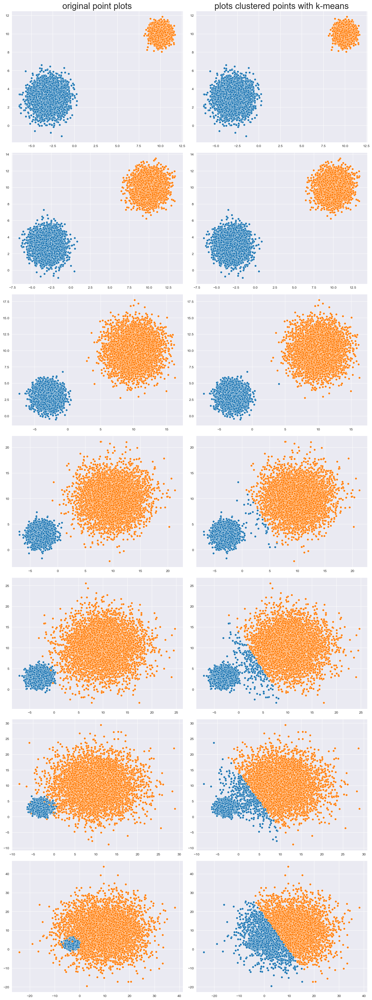

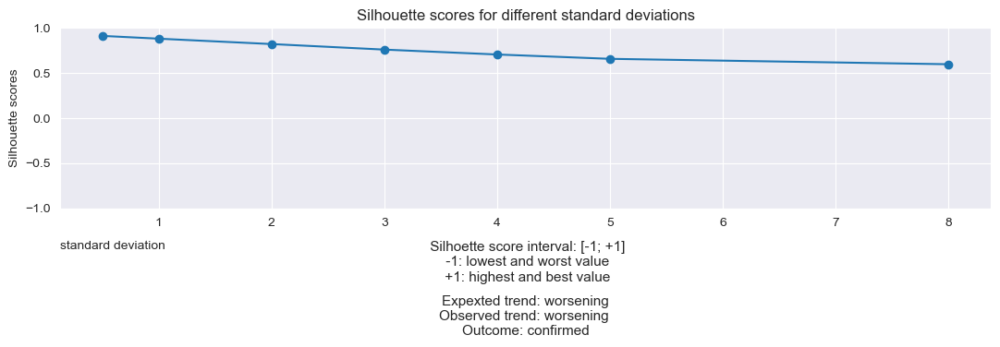

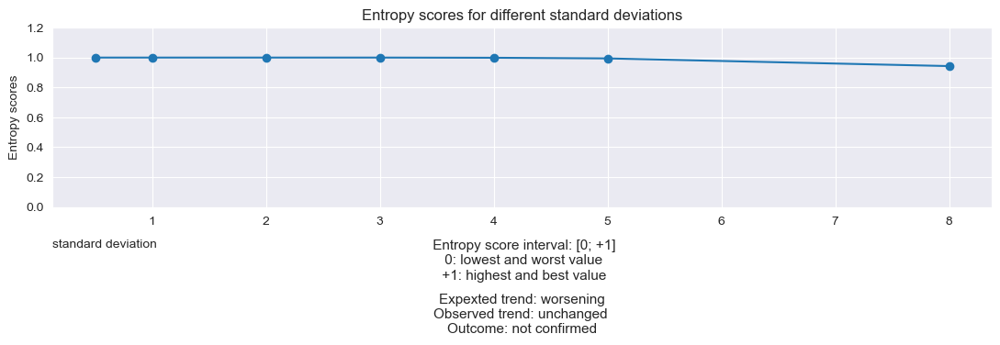

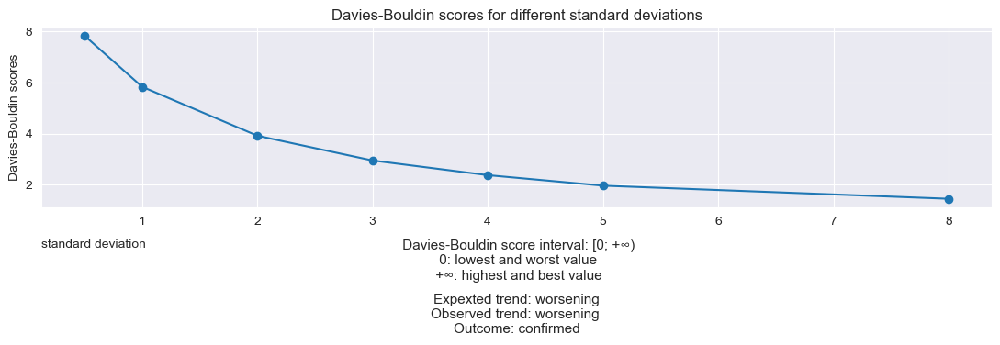

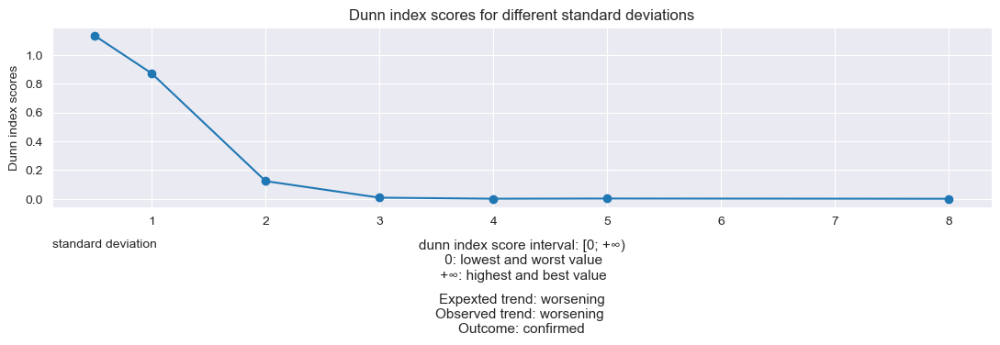

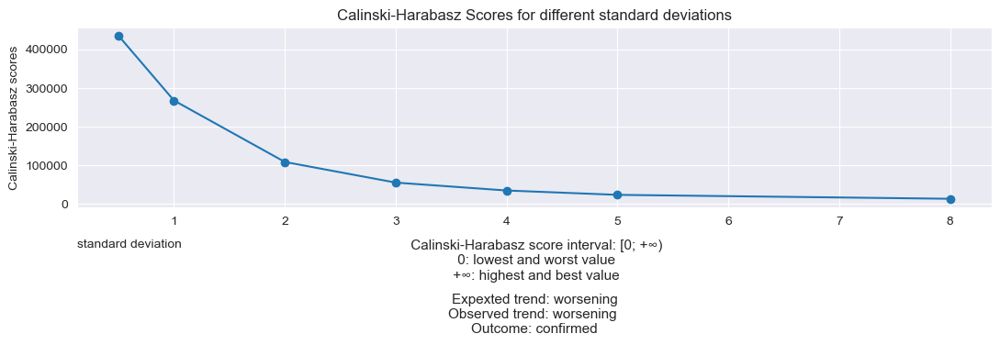

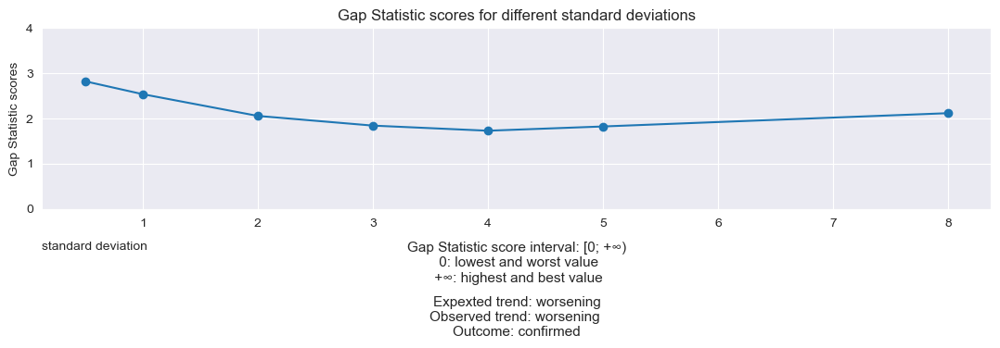

In [40]:
import time
import warnings
from itertools import cycle, islice

from sklearn import cluster, datasets, mixture
from sklearn.neighbors import kneighbors_graph
from sklearn.preprocessing import StandardScaler

# Array for metric values
silhouette_scores = []  
entropy_scores = []
calinski_harabasz_scores = []
davies_bouldin_scores = []
dunn_index_scores = [] 
gap_scores = []

n_samples = 10000


# Standard deviation
sds = [1, 1, 1, 1, 1, 1, 1]
sds2 = [8, 5, 4, 3, 2, 1, 0.5] [::-1]

fig, axs = plt.subplots(7,2, figsize=(15,40))
sns.set_style("darkgrid")
fig.tight_layout()

r = 0
c = 0
c2= 1

for sd, sd2 in zip(sds, sds2):    
    varied = datasets.make_blobs(n_samples=n_samples, cluster_std=[sd, sd2],centers=[[-3,3],[10,10]])
    
    #concatenated_data = np.concatenate((blobs1, blobs2[0]), axis=0)

    # Estrai le coordinate x e y dei punti
    X, y = varied

    if r==0:
        scatter=sns.scatterplot(x=X[:,0], y=X[:,1], hue=y, ax=axs[r,c])
        scatter.set_title('original point plots', fontsize=25)
    sns.scatterplot(x=X[:,0], y=X[:,1], hue=y, ax=axs[r,c])
    axs[r,c].get_legend().remove()
    
    data = pd.DataFrame(np.zeros((X.shape[0], 3)))
    data.iloc[:, [0,1]] = X
    data.iloc[:, 2] = y
    data.iloc[:1000,:].to_csv("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_5/compact_and_sparse_cluster_" + str(sd2) + ".csv")
    
    
    km = KMeans(n_clusters=2, n_init=1, random_state=0)
    km.fit(X)
    l = km.labels_
    cs = km.cluster_centers_
    if cs[0,0] > cs[1,0]:
        l = [1 if x == 0 else 0 for x in l]
    
    # Silhouette calculation
    silhouette_avg = silhouette_score(X, l)
    silhouette_scores.append(silhouette_avg)
    
    # Entropy calculation
    entropy_val = entropy(np.bincount(l) / len(l), base=2)
    entropy_scores.append(entropy_val)
    
    # Calinski-Harabasz index calculation
    calinski_harabasz_index = calinski_harabasz_score(X, l)
    calinski_harabasz_scores.append(calinski_harabasz_index)
    
    # Davies-Bouldin calculation (reciprocal function)
    davies_bouldin_avg = davies_bouldin_score(X, l)
    davies_bouldin_avg = 1 / davies_bouldin_avg
    davies_bouldin_scores.append(davies_bouldin_avg)
    
    # Dunn index calculation
    dunn_score = dunn_index(X, l)
    dunn_index_scores.append(dunn_score)
    
    # Gap Statistic calculation
    optimal_k = OptimalK(parallel_backend='joblib')
    n_clusters = optimal_k(X, cluster_array=np.arange(1, 15))
    gap_df = optimal_k.gap_df
    optimal_gap_statistic = gap_df.loc[gap_df.gap_value.idxmax(), 'gap_value']
    gap_scores.append(optimal_gap_statistic)

    if r==0:
        scatter2=sns.scatterplot(x=X[:,0], y=X[:,1], hue=l, ax=axs[r,c2])
        scatter2.set_title('plots clustered points with k-means', fontsize=25)
    sns.scatterplot(x=X[:,0], y=X[:,1], hue=l, ax=axs[r,c2])
    axs[r,c2].get_legend().remove()        
    
    r=r+1

# Print metric arrays
print("Silhouette Scores:")
for score in silhouette_scores:
    print(score)

print("\nEntropy Scores:")
for score in entropy_scores:
    print(score)
    
print("\nCalinski Harabasz Scores:")
for score in calinski_harabasz_scores:
    print(score)

print("\nDavies-Bouldin Scores:")
for score in davies_bouldin_scores:
    print(score)
    
print("\nDunn-Index Scores:")
for score in dunn_index_scores:
    print(score)
    
print("\nGap Scores:")
for score in gap_scores:
    print(score)

#save the values of the metrics in a txt file
with open("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_5/metrics_values_5.txt", "w") as file:
    file.write("Silhouette Scores:\n")
    for score in silhouette_scores:
        file.write(str(score) + "\n")

    file.write("\nEntropy Scores:\n")
    for score in entropy_scores:
        file.write(str(score) + "\n")

    file.write("\nCalinski Harabasz Scores:\n")
    for score in calinski_harabasz_scores:
        file.write(str(score) + "\n")

    file.write("\nDavies-Bouldin Scores:\n")
    for score in davies_bouldin_scores:
        file.write(str(score) + "\n")

    file.write("\nDunn-Index Scores:\n")
    for score in dunn_index_scores:
        file.write(str(score) + "\n")
    
    file.write("\nGap Scores:\n")
    for score in gap_scores:
        file.write(str(score) + "\n")

    
# Plot of Silhouette variations
plt.figure(figsize=(11, 5))
plt.plot(sds2, silhouette_scores, marker='o')
plt.title('Silhouette scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Silhouette scores')
plt.grid(True)
plt.ylim(-1, 1)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_5/variazioni_Silhouette_5.png'
text = ' Silhoette score interval: [-1; +1]\n -1: lowest and worst value\n +1: highest and best value'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
text2='Expexted trend: worsening\nObserved trend: worsening \nOutcome: confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Entropy variations
plt.figure(figsize=(11, 5))
plt.plot(sds2, entropy_scores, marker='o')
plt.title('Entropy scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Entropy scores')
plt.grid(True)
plt.ylim(0, 1.2)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_5/variazioni_Entropy_5.png'
text=' Entropy score interval: [0; +1]\n 0: lowest and worst value\n +1: highest and best value'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
text2='Expexted trend: worsening\nObserved trend: unchanged \nOutcome: not confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Davies_Bouldin variations
plt.figure(figsize=(11, 5))
plt.plot(sds2, davies_bouldin_scores, marker='o')
plt.title('Davies-Bouldin scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Davies-Bouldin scores')
plt.grid(True)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_5/variazioni_Davies_Bouldin_5.png'
text=' Davies-Bouldin score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
text2='Expexted trend: worsening\nObserved trend: worsening \nOutcome: confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Dunn_index variations
plt.figure(figsize=(11, 5))
plt.plot(sds2, dunn_index_scores, marker='o')
plt.title('Dunn index scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Dunn index scores')
plt.grid(True)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_5/variazioni_dunn_index_5.png'
text = 'dunn index score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value' 
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes, fontsize=11)
text2='Expexted trend: worsening\nObserved trend: worsening \nOutcome: confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Calinski_Harabasz Scores variations
plt.figure(figsize=(11, 5))
plt.plot(sds2, calinski_harabasz_scores, marker='o')
plt.title('Calinski-Harabasz Scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Calinski-Harabasz scores')
plt.grid(True)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_5/variazioni_Calinski_Harabasz_5.png'
text=' Calinski-Harabasz score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value'
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
text2='Expexted trend: worsening\nObserved trend: worsening \nOutcome: confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

# Plot of Gap Statistic variations
plt.figure(figsize=(11, 5))
plt.plot(sds2, gap_scores, marker='o')
plt.title('Gap Statistic scores for different standard deviations')
plt.xlabel('standard deviation', labelpad=10, loc='left')
plt.ylabel('Gap Statistic scores')
plt.grid(True)
plt.ylim(0, 4)
file_path = '/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_5/variazioni_gap_5.png'
text = 'Gap Statistic score interval: [0; +∞)\n 0: lowest and worst value\n +∞: highest and best value' 
plt.text(0.5, -0.3, text, ha='center', va='center', transform=plt.gca().transAxes, fontsize=11)
text2='Expexted trend: worsening\nObserved trend: worsening \nOutcome: confirmed'
plt.text(0.5, -0.6, text2, ha='center', va='center', transform=plt.gca().transAxes,fontsize=11)
plt.tight_layout()
plt.savefig(file_path)
plt.show()

with open("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_5/report_5", "w") as file:
    file.write("Report:\n")
    file.write("I expected the metrics to get worse as the standard deviation increases. This happened with all metrics except Entropy which remains practicall\nconstant for all standard deviations")

fig.savefig("/Users/andreaspagnolo/Desktop/uni/stage/result/result_data_5/compact_and_sparse.png", facecolor="gray")

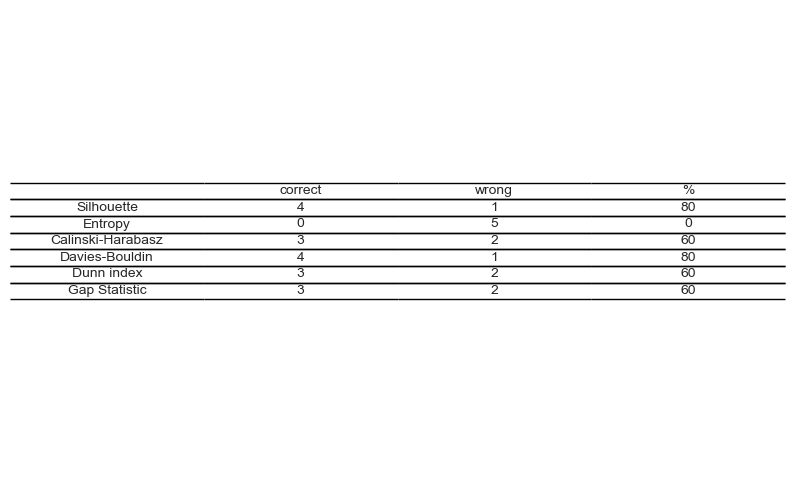

In [43]:
file_path="/Users/andreaspagnolo/Desktop/uni/stage/result/final_result/final_result"
dati_tabella = [
    ["","correct", "wrong", "%"],
    ["Silhouette", 4, 1, 80],
    ["Entropy", 0, 5, 0],
    ["Calinski-Harabasz", 3, 2, 60],
    ["Davies-Bouldin", 4, 1, 80],
    ["Dunn index", 3, 2, 60],
    ["Gap Statistic", 3, 2, 60]
]
plt.figure(figsize=(10, 6))
plt.table(cellText=dati_tabella, loc='center', cellLoc='center', edges='horizontal')
plt.axis('off')
plt.savefig(file_path)
plt.show()